In [1]:
import numpy as np
import pandas as pd
from plots import retrieve_memory, plot_series_returns, plot_4series, plot_rmean_std, plot_top_drawdown_underwater, \
    plot_portfolio_weights, plot_rolling_volatility, plot_rolling_sharpe, list_to_matrix, plot_series_actions_shares

/home/hieu/miniconda3/envs/rlfin/lib/python3.13/site-packages/pyfolio/pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


## 1. Setup
### 1.1. Load data

In [2]:
index_names = {'US': 'DowJones30Index', 'JP': 'TOPIX30Index', 'VN': 'VN30Index', 'VNn': 'VN30new'}
data_df_US = pd.read_csv(f'data/{index_names['US']}_final.csv', index_col=0)
data_df_JP = pd.read_csv(f'data/{index_names['JP']}_final.csv', index_col=0)
data_df_VN = pd.read_csv(f'data/{index_names['VN']}_final.csv', index_col=0)
data_df_VNn = pd.read_csv(f'data/{index_names['VNn']}_final.csv', index_col=0)
data_df = {'US': data_df_US, 'JP': data_df_JP, 'VN': data_df_VN, 'VNn': data_df_VNn}

In [3]:
markets = ['US', 'JP', 'VN', 'VNn']
INITIAL_CASH = {'US': 1e6, 'JP': 10e6, 'VN':1e6, 'VNn':1e6}
START_TRADE_DATES = {'US': '2021-01-01', 'JP': '2021-01-01', 'VN': '2023-01-01', 'VNn': '2021-01-01'}
trade_dates = {}
trade_data = {}
for mk in markets:
    df = data_df[mk]
    trade_data[mk] = df[df['date']>=START_TRADE_DATES[mk]]
    dates = trade_data[mk]['date'].unique()
    trade_dates[mk] = pd.to_datetime(dates, format='%Y-%m-%d')

tickers = {f'{mk}': list(data_df[mk]['ticker'].unique()) for mk in markets}

Y_trade = {'US': {}, 'JP': {}, 'VN': {}, 'VNn': {}}
markets = ['US', 'JP', 'VN', 'VNn']


for mk in markets:
    df = trade_data[mk]
    for tic in tickers[mk]:
        Y_trade[mk][tic] = df[df['ticker']==tic]['adjcp'].to_numpy()


In [4]:
company_names = {}
for mk in markets:
    company_names[mk] = list(pd.read_csv(f'data/{index_names[mk]}_info.csv')['Company'].values)

### 1.2. Retrieve history of assets, actions, number of shares, stock prices, and portfolio weights over time

In [5]:
model_mem = {'A2C': {}, 'PPO': {}, 'DDPG': {}, 'TD3': {}}

for model in model_mem.keys():
    mems = retrieve_memory(model=model, markets=markets, tickers=tickers, trade_dates=trade_dates, trade_data=trade_data)
    model_mem[model]['asset_mem'] = mems[0]
    model_mem[model]['action_mem'] = mems[1]
    model_mem[model]['n_shares_mem'] = mems[2]
    model_mem[model]['portfolio_weights'] = mems[3]

/home/hieu/BDMA/thesis/hieu/plots.py:64: RuntimeWarning: invalid value encountered in divide
  portfolio_weights[mk] = prices_ticker[mk] * n_shares_matrix / portfolio_value_history.reshape(-1, 1)
/home/hieu/BDMA/thesis/hieu/plots.py:64: RuntimeWarning: invalid value encountered in divide
  portfolio_weights[mk] = prices_ticker[mk] * n_shares_matrix / portfolio_value_history.reshape(-1, 1)
/home/hieu/BDMA/thesis/hieu/plots.py:64: RuntimeWarning: invalid value encountered in divide
  portfolio_weights[mk] = prices_ticker[mk] * n_shares_matrix / portfolio_value_history.reshape(-1, 1)
/home/hieu/BDMA/thesis/hieu/plots.py:64: RuntimeWarning: invalid value encountered in divide
  portfolio_weights[mk] = prices_ticker[mk] * n_shares_matrix / portfolio_value_history.reshape(-1, 1)
/home/hieu/BDMA/thesis/hieu/plots.py:64: RuntimeWarning: invalid value encountered in divide
  portfolio_weights[mk] = prices_ticker[mk] * n_shares_matrix / portfolio_value_history.reshape(-1, 1)
/home/hieu/BDMA/thes

## 2. Series and Returns of Single Stockd

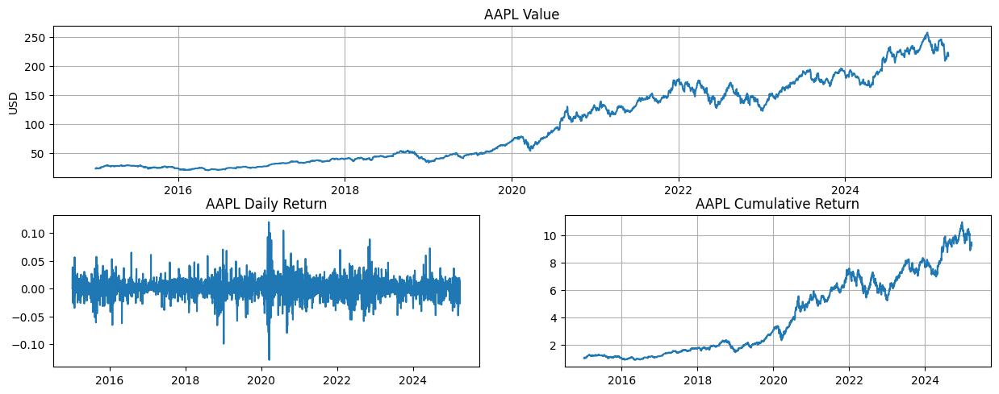

In [6]:
plot_series_returns(market='US',
                    ticker='AAPL',
                    model='',
                    dates= pd.to_datetime(data_df_US['date'].unique(), format='%Y-%m-%d'),
                    Y=data_df_US.loc[data_df_US['ticker']=='AAPL', 'adjcp'].values)

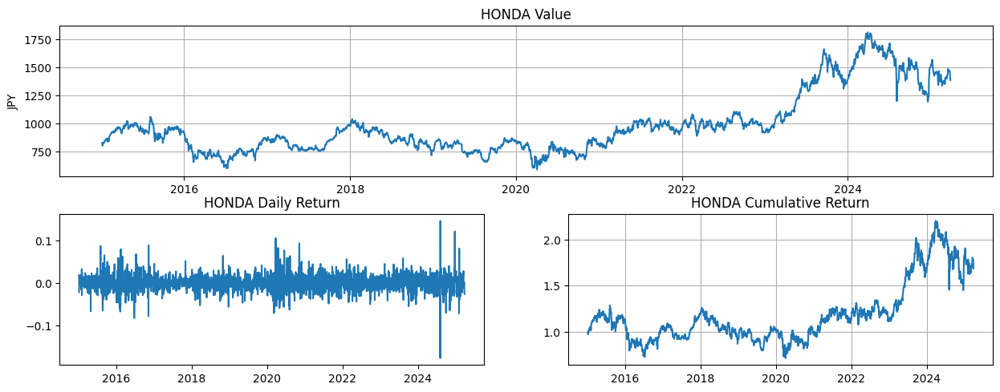

In [7]:
plot_series_returns(market='JP',
                    ticker='HONDA',
                    model='',
                    dates= pd.to_datetime(data_df_JP['date'].unique(), format='%Y-%m-%d'),
                    Y=data_df_JP.loc[data_df_JP['ticker']=='7267.T', 'adjcp'].values)

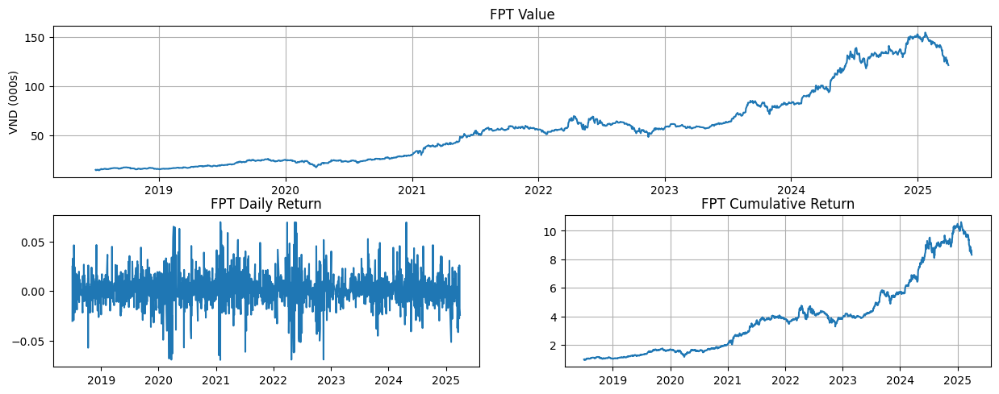

In [8]:
plot_series_returns(market='VN',
                    ticker='FPT',
                    model='',
                    dates= pd.to_datetime(data_df_VN['date'].unique(), format='%Y-%m-%d'),
                    Y=data_df_VN.loc[data_df_VN['ticker']=='FPT', 'adjcp'].values)

## 3. Portfolio Value Evolution

Ending asset:
A2C: 1586500.1056654428
PPO: 1974148.1034049997
DDPG: 1227845.9653181706
TD3: 1348312.7189255182


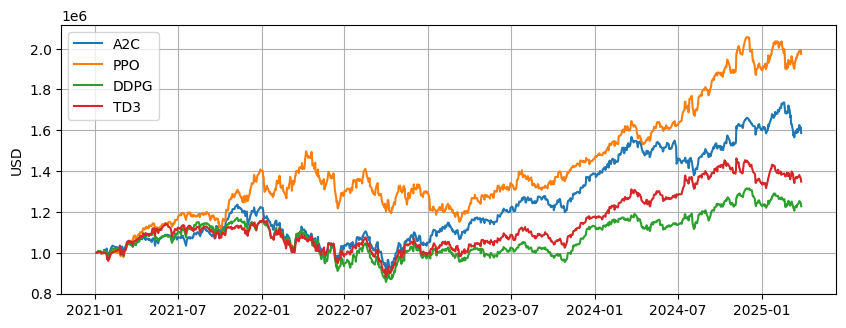

In [6]:
plot_4series(market='US', dates=trade_dates['US'], model_mem=model_mem)

Ending asset:
A2C: 14885631.023708284
PPO: 24221311.62144676
DDPG: 9427998.448227473
TD3: 13310893.264346104


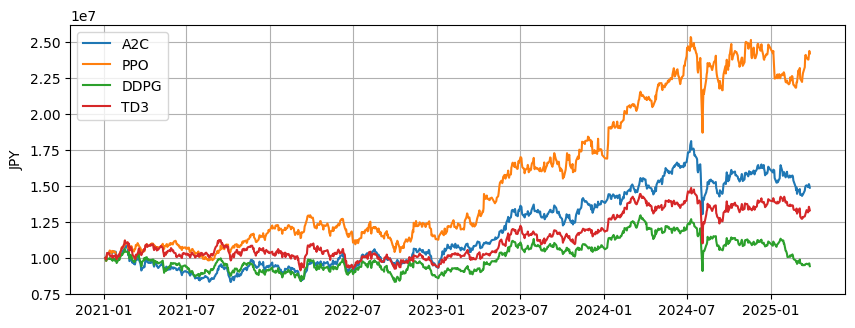

In [7]:
plot_4series(market='JP', dates=trade_dates['JP'], model_mem=model_mem)

Ending asset:
A2C: 1280931.7194000017
PPO: 1058372.2099900015
DDPG: 1058276.8321099996
TD3: 1142565.023110005


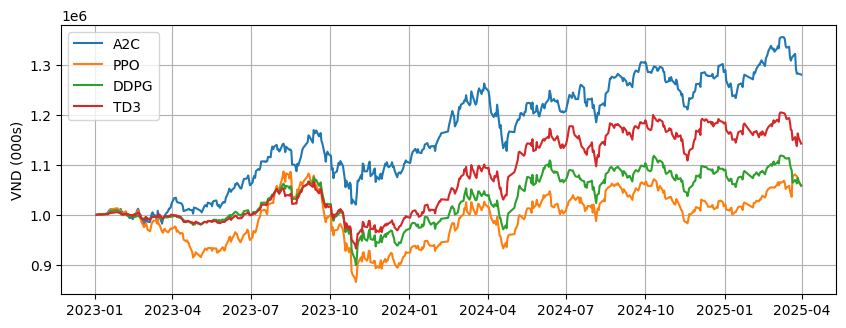

In [8]:
plot_4series(market='VN', dates=trade_dates['VN'], model_mem=model_mem)

Ending asset:
A2C: 1574143.008530005
PPO: 1928192.961860001
DDPG: 1139290.1270100027
TD3: 1157309.328260006


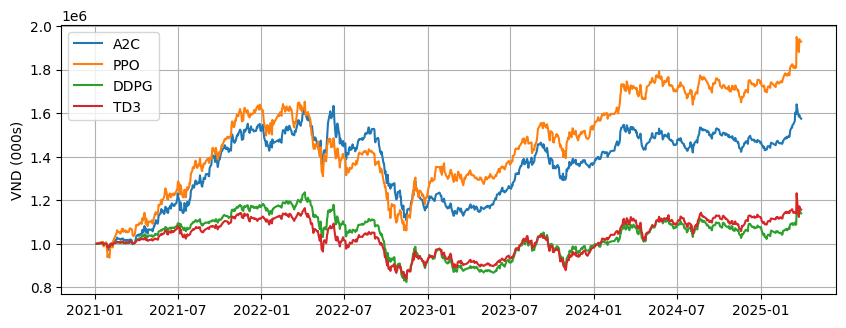

In [9]:
plot_4series(market='VNn', dates=trade_dates['VNn'], model_mem=model_mem)

## 3. Returns Mean and Std

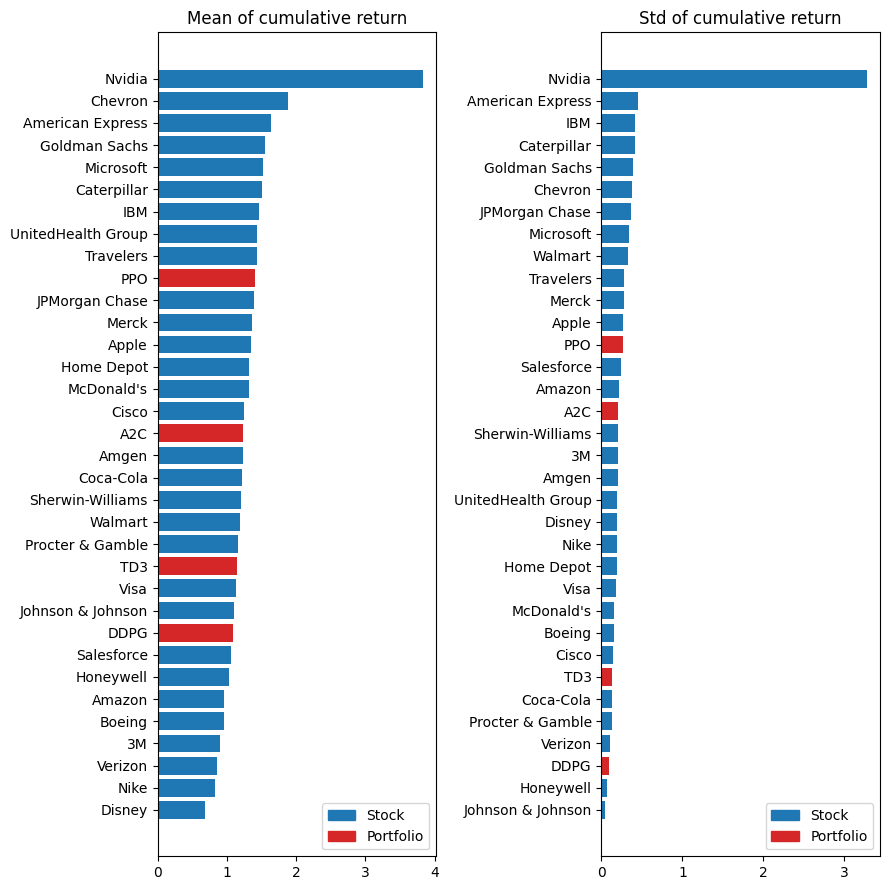

In [10]:
plot_rmean_std(market='US', tics=tickers['US'], Y_data=trade_data['US'], model_mem=model_mem, com_names=company_names['US'])

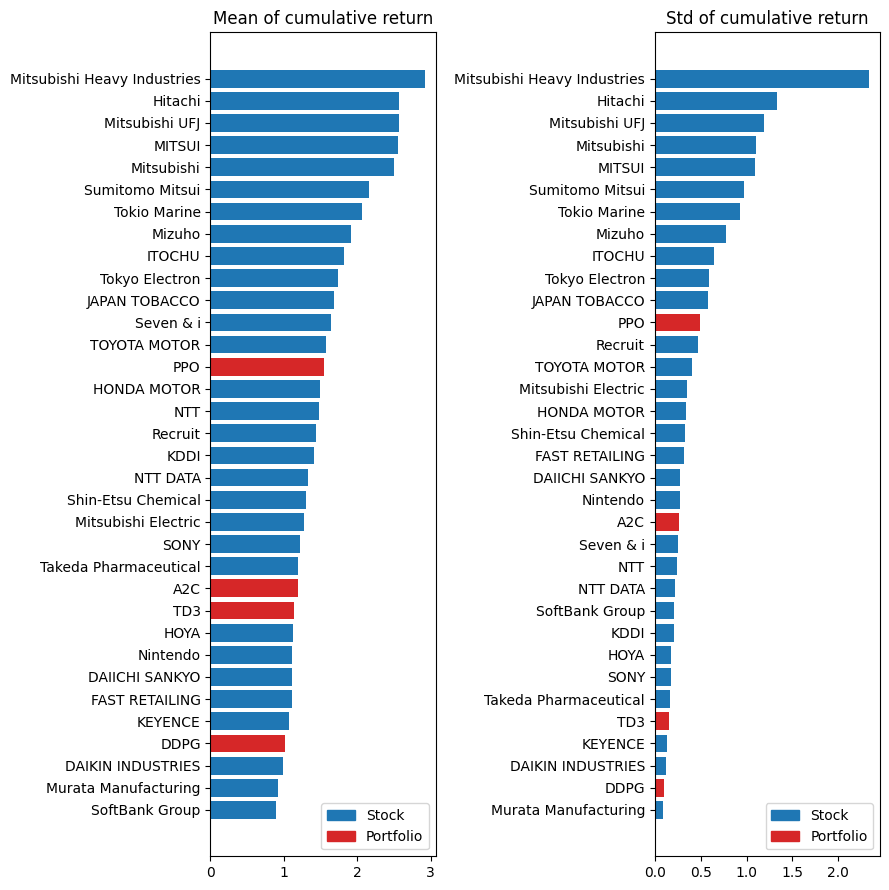

In [11]:
plot_rmean_std(market='JP', tics=tickers['JP'], Y_data=trade_data['JP'], model_mem=model_mem, com_names=company_names['JP'])

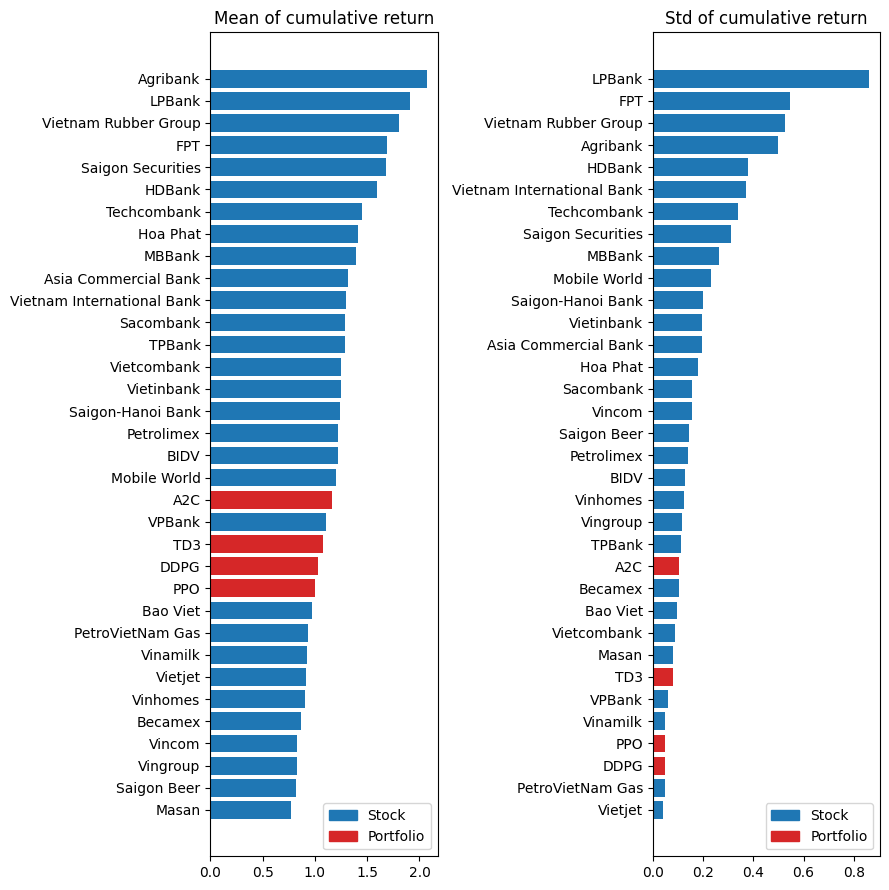

In [12]:
plot_rmean_std(market='VN', tics=tickers['VN'], Y_data=trade_data['VN'], model_mem=model_mem, com_names=company_names['VN'])

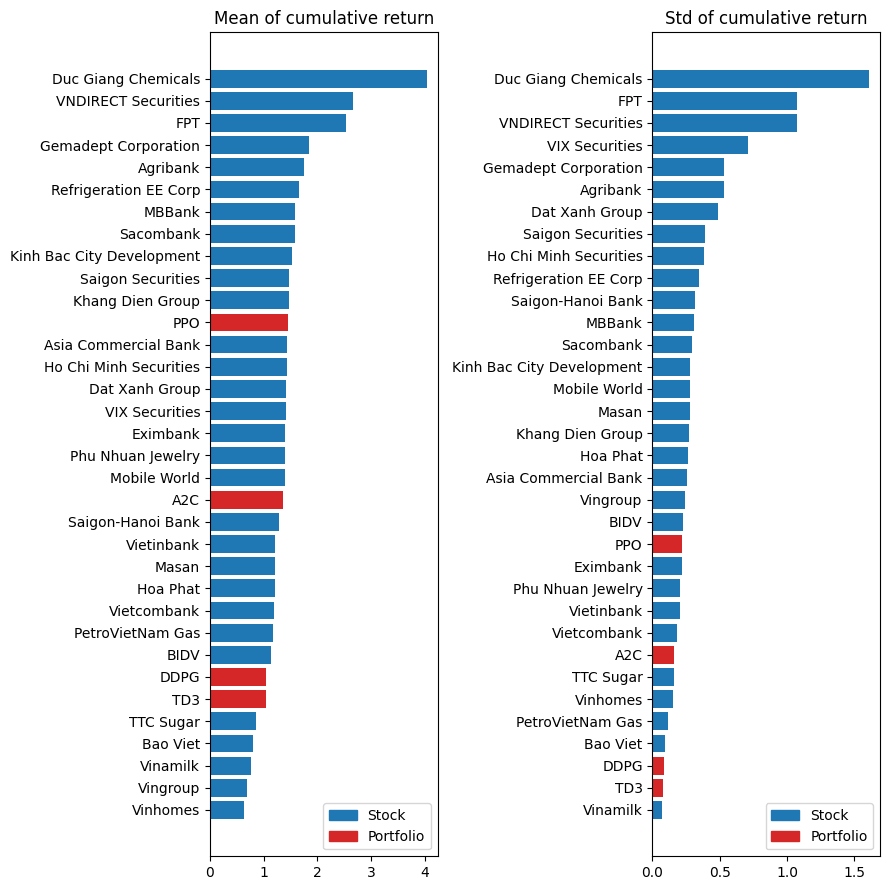

In [13]:
plot_rmean_std(market='VNn', tics=tickers['VNn'], Y_data=trade_data['VNn'], model_mem=model_mem, com_names=company_names['VNn'])

## 4. Drawdown

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         25.684875 2021-11-08  2022-09-30    2023-07-13      439
1          11.98761 2024-03-21  2024-08-05    2024-10-17      151
2          9.890594 2025-02-18  2025-03-13           NaT      NaN
3           6.17877 2023-09-11  2023-10-27    2023-11-14       47
4          4.980286 2024-11-29  2024-12-18    2025-01-23       40


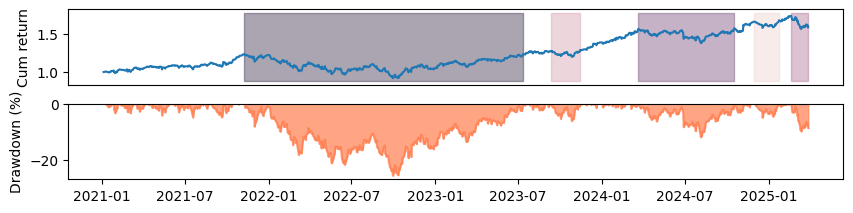

In [14]:
plot_top_drawdown_underwater(market='US', model='A2C', dates=trade_dates['US'], Y=np.array(model_mem['A2C']['asset_mem']['US']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         23.096269 2022-04-08  2023-03-10    2024-01-26      471
1         10.053992 2021-12-29  2022-02-24    2022-03-24       62
2            9.0505 2024-11-29  2024-12-19           NaT      NaN
3          7.021507 2021-09-02  2021-10-04    2021-10-15       32
4           6.81061 2024-03-21  2024-04-15    2024-07-08       78


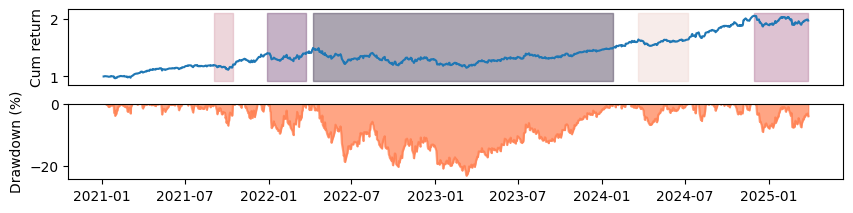

In [15]:
plot_top_drawdown_underwater(market='US', model='PPO', dates=trade_dates['US'], Y=np.array(model_mem['PPO']['asset_mem']['US']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         26.879841 2021-11-08  2022-09-30    2024-02-29      604
1          8.339388 2024-11-29  2025-03-13           NaT      NaN
2           7.00105 2024-03-28  2024-04-30    2024-07-31       90
3          6.361083 2024-07-31  2024-08-05    2024-08-19       14
4          5.590443 2021-08-12  2021-09-30    2021-10-26       54


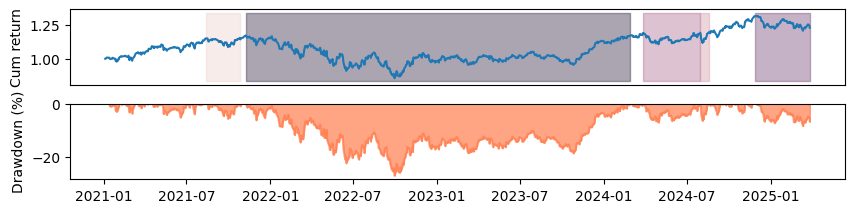

In [16]:
plot_top_drawdown_underwater(market='US', model='DDPG', dates=trade_dates['US'], Y=np.array(model_mem['DDPG']['asset_mem']['US']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         24.374196 2022-01-04  2022-09-30    2023-12-13      507
1          9.952358 2024-11-06  2025-01-10           NaT      NaN
2          6.354989 2024-03-21  2024-05-01    2024-07-12       82
3          6.323341 2021-06-04  2021-09-30    2021-12-15      139
4           4.70346 2024-07-17  2024-08-05    2024-08-23       28


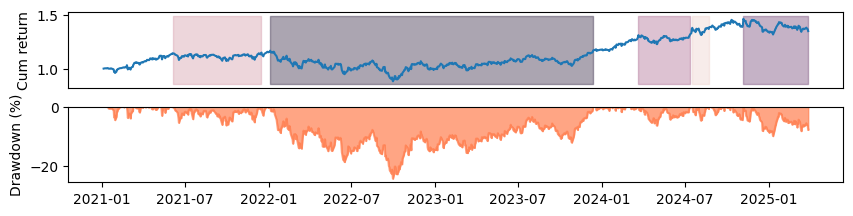

In [17]:
plot_top_drawdown_underwater(market='US', model='TD3', dates=trade_dates['US'], Y=np.array(model_mem['TD3']['asset_mem']['US']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         28.047229 2024-07-11  2024-08-05           NaT      NaN
1          24.04105 2021-02-16  2021-10-06    2023-02-10      519
2         10.631239 2023-08-01  2023-10-04    2023-11-15       77
3           7.32931 2024-03-22  2024-04-19    2024-05-10       36
4          7.224176 2023-11-17  2023-12-08    2024-01-11       40


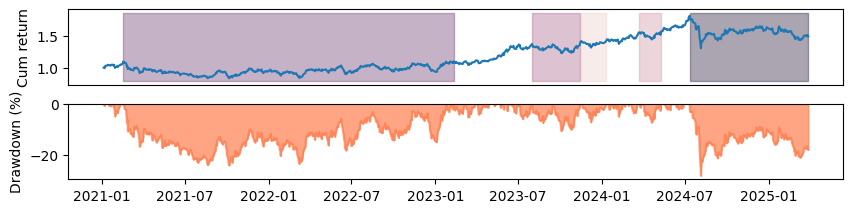

In [18]:
plot_top_drawdown_underwater(market='JP', model='A2C', dates=trade_dates['JP'], Y=np.array(model_mem['A2C']['asset_mem']['JP']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         26.243642 2024-07-10  2024-08-05           NaT      NaN
1         19.830615 2022-03-29  2022-10-12    2023-03-08      247
2         12.268982 2021-02-16  2021-08-19    2021-11-08      190
3         10.229512 2023-09-15  2023-10-04    2023-11-09       40
4          8.309784 2023-11-28  2024-01-09    2024-01-12       34


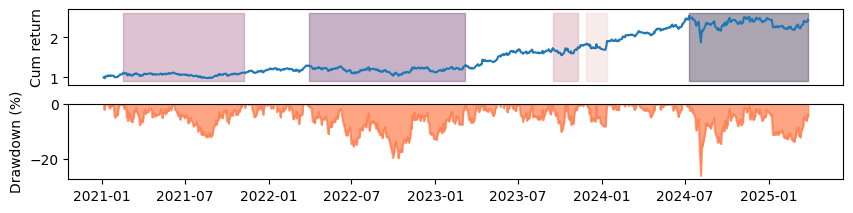

In [19]:
plot_top_drawdown_underwater(market='JP', model='PPO', dates=trade_dates['JP'], Y=np.array(model_mem['PPO']['asset_mem']['JP']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         29.887869 2024-03-22  2024-08-05           NaT      NaN
1         21.490099 2021-02-16  2022-09-30    2023-06-06      601
2         10.795914 2023-08-01  2023-10-30    2024-01-12      119
3          7.083678 2023-06-16  2023-07-12    2023-08-01       33
4          3.692005 2024-03-05  2024-03-13    2024-03-18       10


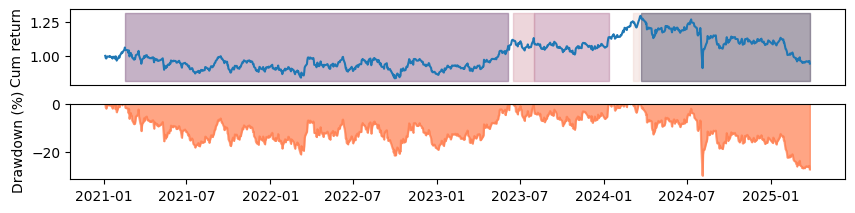

In [20]:
plot_top_drawdown_underwater(market='JP', model='DDPG', dates=trade_dates['JP'], Y=np.array(model_mem['DDPG']['asset_mem']['JP']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         25.928949 2024-07-11  2024-08-05           NaT      NaN
1         18.705406 2021-09-13  2022-03-08    2023-05-22      441
2         11.548868 2021-02-16  2021-03-11    2021-09-10      149
3         10.571154 2023-07-03  2023-08-18    2024-01-11      139
4          9.385454 2024-03-22  2024-04-19    2024-07-03       74


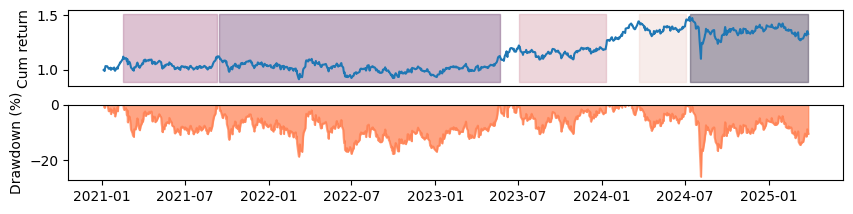

In [21]:
plot_top_drawdown_underwater(market='JP', model='TD3', dates=trade_dates['JP'], Y=np.array(model_mem['TD3']['asset_mem']['JP']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         12.771492 2023-09-12  2023-10-31    2024-02-16      114
1         10.688926 2024-03-28  2024-04-23    2024-08-21      105
2          7.311508 2024-10-01  2024-11-19    2025-02-12       97
3          5.550932 2025-03-10  2025-03-31           NaT      NaN
4           4.82507 2023-08-08  2023-08-23    2023-09-05       21


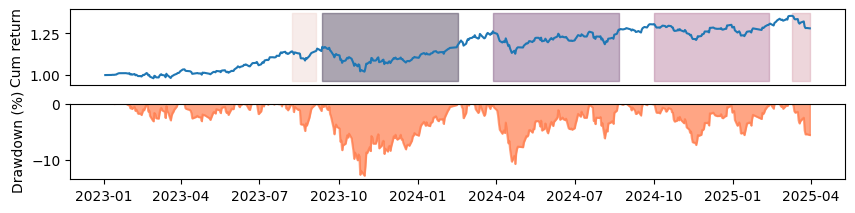

In [22]:
plot_top_drawdown_underwater(market='VN', model='A2C', dates=trade_dates['VN'], Y=np.array(model_mem['A2C']['asset_mem']['VN']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         20.375618 2023-08-08  2023-10-31           NaT      NaN
1          9.783809 2023-01-27  2023-04-25    2023-07-21      126
2          1.352256 2023-07-31  2023-08-03    2023-08-04        5
3          0.097619 2023-01-11  2023-01-16    2023-01-17        5
4           0.06621 2023-01-05  2023-01-06    2023-01-09        3


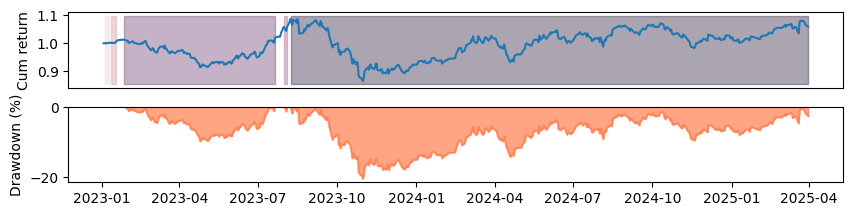

In [23]:
plot_top_drawdown_underwater(market='VN', model='PPO', dates=trade_dates['VN'], Y=np.array(model_mem['PPO']['asset_mem']['VN']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         16.386493 2023-09-12  2023-10-31    2024-05-17      179
1          7.703567 2024-06-12  2024-08-05    2024-10-10       87
2          7.225968 2024-10-11  2024-11-19    2025-03-07      106
3           5.40021 2025-03-07  2025-03-31           NaT      NaN
4          3.002891 2023-08-08  2023-08-23    2023-09-06       22


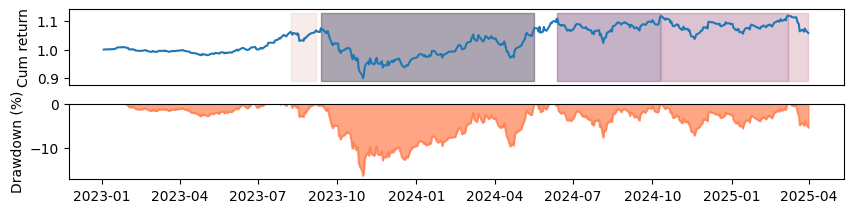

In [24]:
plot_top_drawdown_underwater(market='VN', model='DDPG', dates=trade_dates['VN'], Y=np.array(model_mem['DDPG']['asset_mem']['VN']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         12.534113 2023-09-06  2023-10-31    2024-02-28      126
1          7.610758 2024-10-10  2024-11-19    2025-03-06      106
2          6.827482 2024-07-08  2024-08-05    2024-08-21       33
3          6.393002 2024-03-28  2024-04-19    2024-05-06       28
4          5.593411 2025-03-07  2025-03-26           NaT      NaN


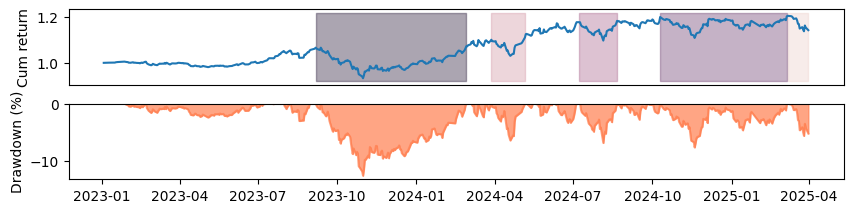

In [25]:
plot_top_drawdown_underwater(market='VN', model='TD3', dates=trade_dates['VN'], Y=np.array(model_mem['TD3']['asset_mem']['VN']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         32.153104 2022-06-08  2022-11-15    2025-03-21      728
1         17.309054 2022-04-06  2022-05-16    2022-06-08       46
2          7.987206 2021-12-02  2022-01-18    2022-03-22       79
3          7.334134 2021-07-01  2021-07-13    2021-07-30       22
4          4.798815 2021-09-23  2021-09-27    2021-10-05        9


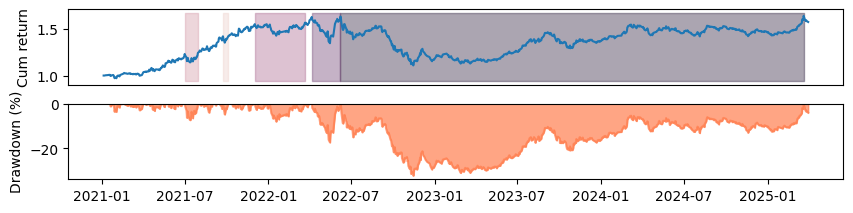

In [26]:
plot_top_drawdown_underwater(market='VNn', model='A2C', dates=trade_dates['VNn'], Y=np.array(model_mem['A2C']['asset_mem']['VNn']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         35.778466 2022-04-06  2022-11-15    2024-02-28      496
1          8.622281 2021-12-28  2022-01-11    2022-02-17       38
2          8.584195 2024-05-23  2024-08-05    2025-03-06      206
3          7.175918 2021-01-18  2021-02-01    2021-02-09       17
4          6.544231 2022-02-17  2022-03-14    2022-03-22       24


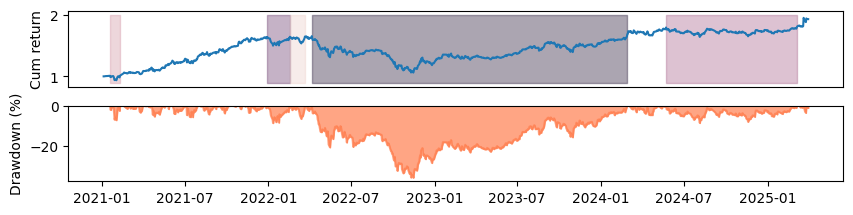

In [27]:
plot_top_drawdown_underwater(market='VNn', model='PPO', dates=trade_dates['VNn'], Y=np.array(model_mem['PPO']['asset_mem']['VNn']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0         33.316276 2022-04-06  2022-11-15           NaT      NaN
1          4.244409 2022-01-04  2022-01-18    2022-02-17       33
2          3.376653 2021-07-02  2021-07-19    2021-08-03       23
3           3.29422 2022-02-25  2022-03-14    2022-03-22       18
4          2.651404 2021-08-19  2021-08-24    2021-09-23       26


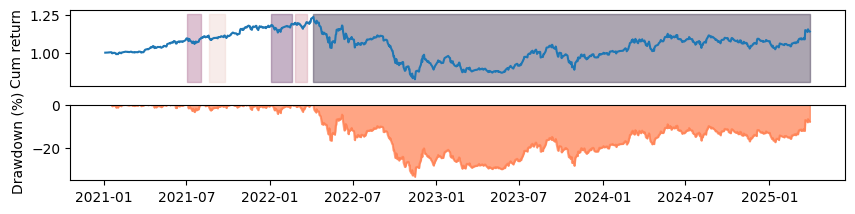

In [28]:
plot_top_drawdown_underwater(market='VNn', model='DDPG', dates=trade_dates['VNn'], Y=np.array(model_mem['DDPG']['asset_mem']['VNn']), top=5)

  Net drawdown in %  Peak date Valley date Recovery date Duration
0          27.96828 2022-04-06  2022-11-15    2025-03-21      773
1           8.83562 2025-03-21  2025-03-26           NaT      NaN
2          5.335365 2021-07-01  2021-07-19    2021-09-23       61
3           4.58769 2021-11-15  2022-01-18    2022-03-22       92
4          2.054102 2021-01-15  2021-01-28    2021-02-17       24


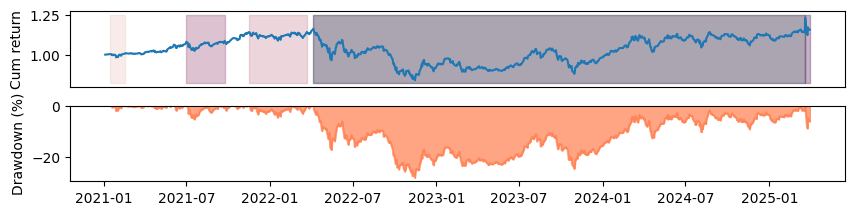

In [29]:
plot_top_drawdown_underwater(market='VNn', model='TD3', dates=trade_dates['VNn'], Y=np.array(model_mem['TD3']['asset_mem']['VNn']), top=5)

## 5. Portfolio Weight Distribution Over Time

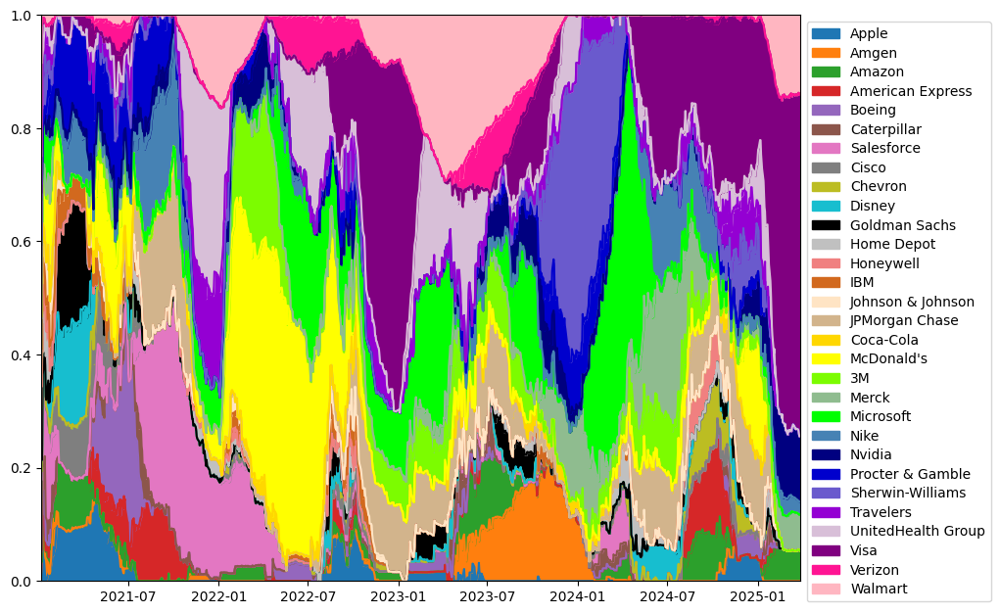

In [31]:
plot_portfolio_weights(market='US', model='A2C', dates=trade_dates['US'], weights=model_mem['A2C']['portfolio_weights']['US'], tics=tickers['US'], com_names=company_names['US'])

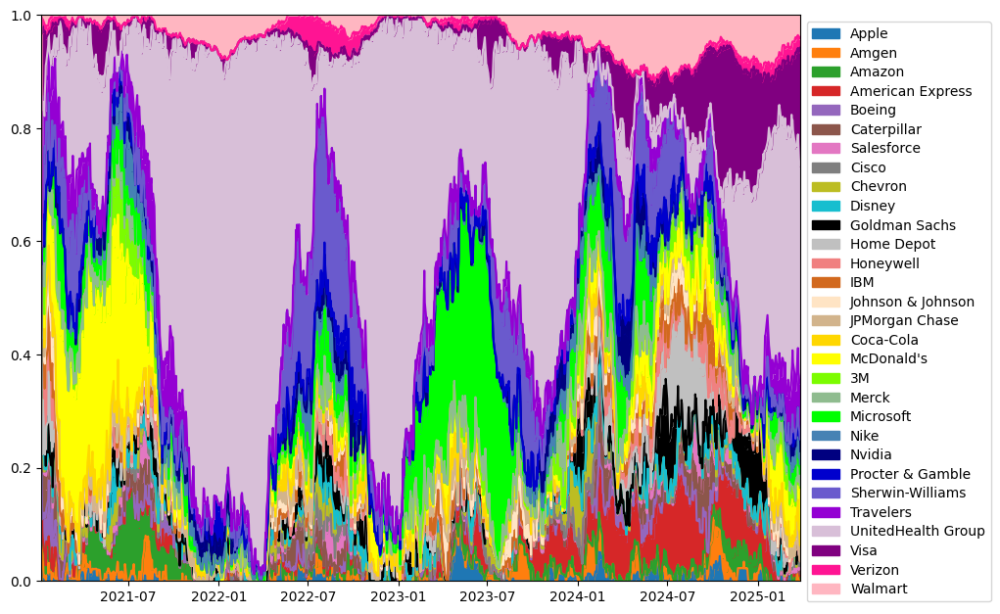

In [32]:
plot_portfolio_weights(market='US', model='PPO', dates=trade_dates['US'], weights=model_mem['PPO']['portfolio_weights']['US'], tics=tickers['US'], com_names=company_names['US'])

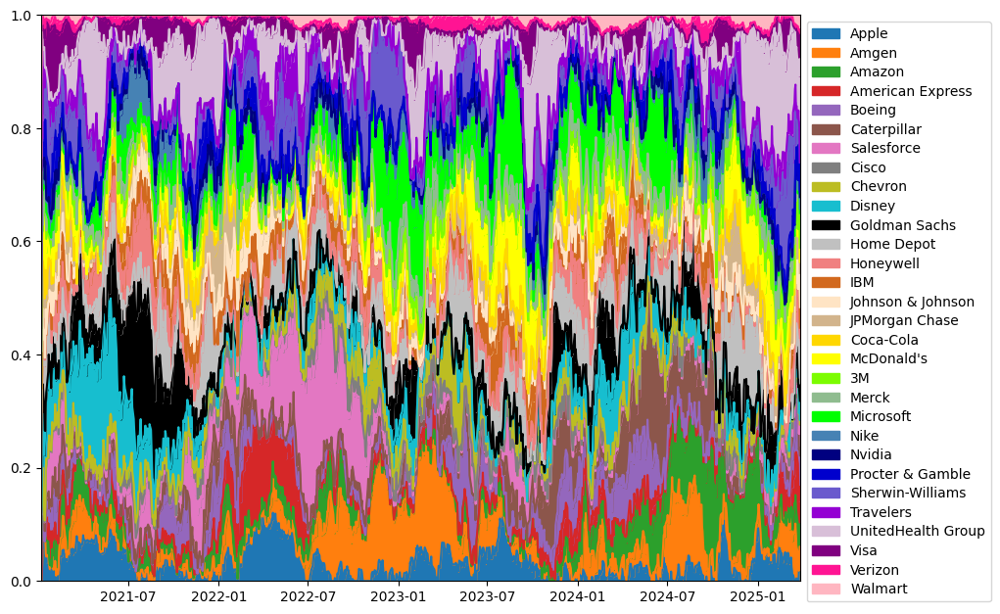

In [33]:
plot_portfolio_weights(market='US', model='DDPG', dates=trade_dates['US'], weights=model_mem['DDPG']['portfolio_weights']['US'], tics=tickers['US'], com_names=company_names['US'])

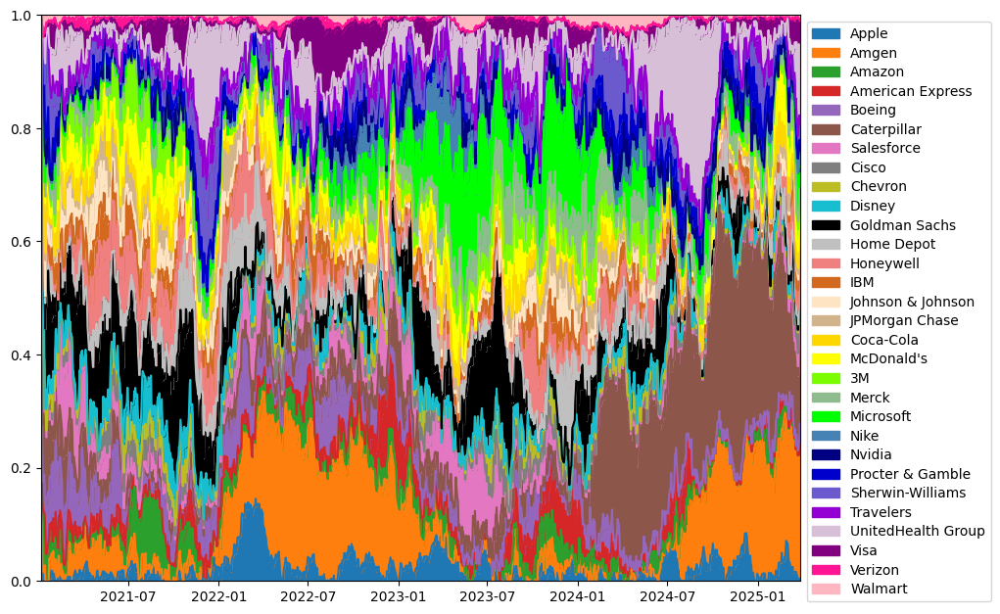

In [34]:
plot_portfolio_weights(market='US', model='TD3', dates=trade_dates['US'], weights=model_mem['TD3']['portfolio_weights']['US'], tics=tickers['US'], com_names=company_names['US'])

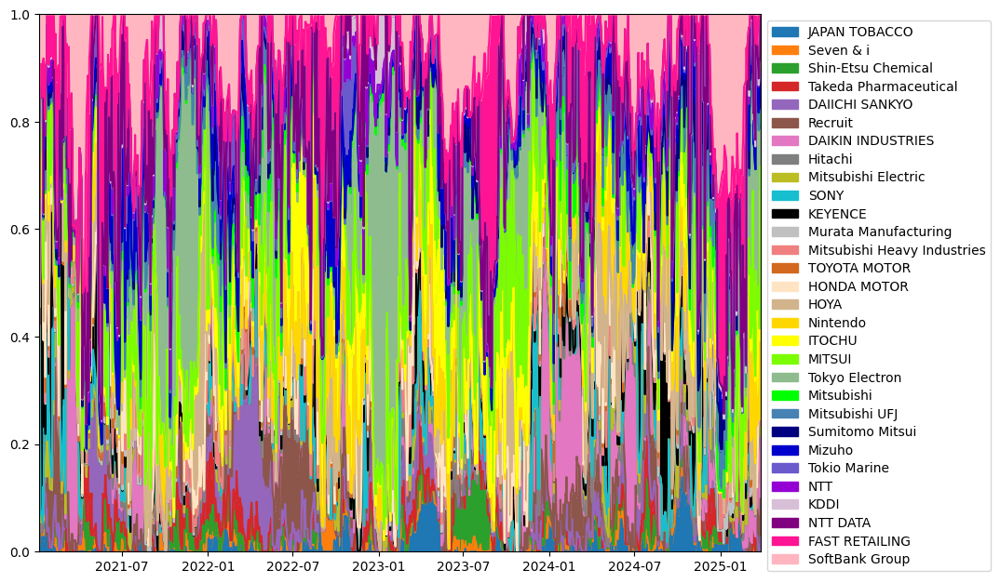

In [35]:
plot_portfolio_weights(market='JP', model='A2C', dates=trade_dates['JP'], weights=model_mem['A2C']['portfolio_weights']['JP'], tics=tickers['JP'], com_names=company_names['JP'])

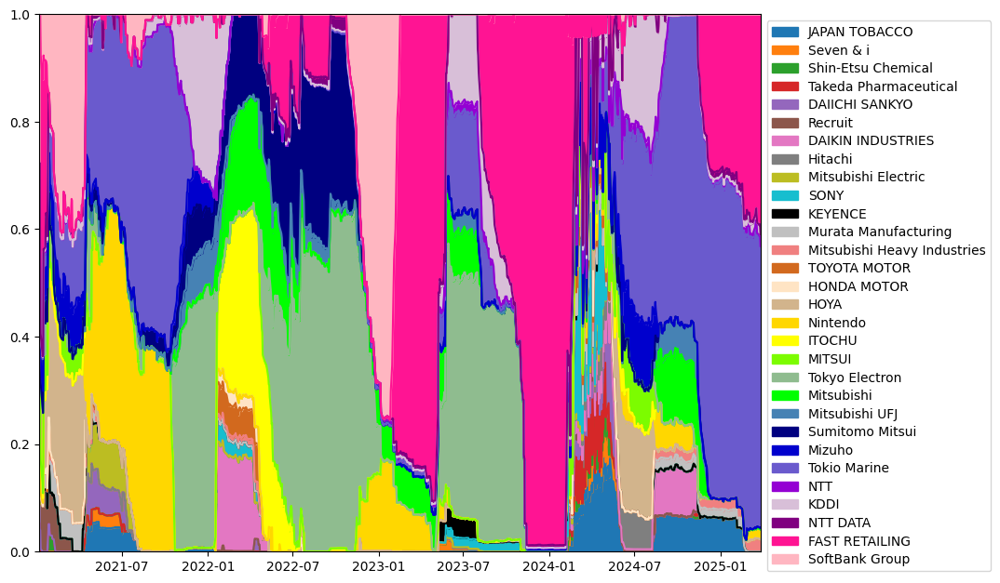

In [36]:
plot_portfolio_weights(market='JP', model='PPO', dates=trade_dates['JP'], weights=model_mem['PPO']['portfolio_weights']['JP'], tics=tickers['JP'], com_names=company_names['JP'])

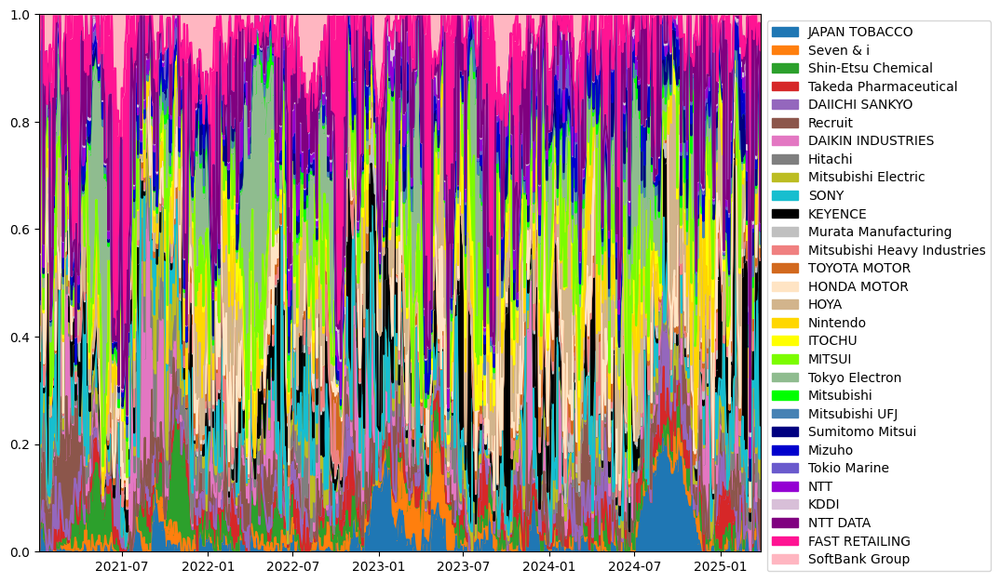

In [37]:
plot_portfolio_weights(market='JP', model='DDPG', dates=trade_dates['JP'], weights=model_mem['DDPG']['portfolio_weights']['JP'], tics=tickers['JP'], com_names=company_names['JP'])

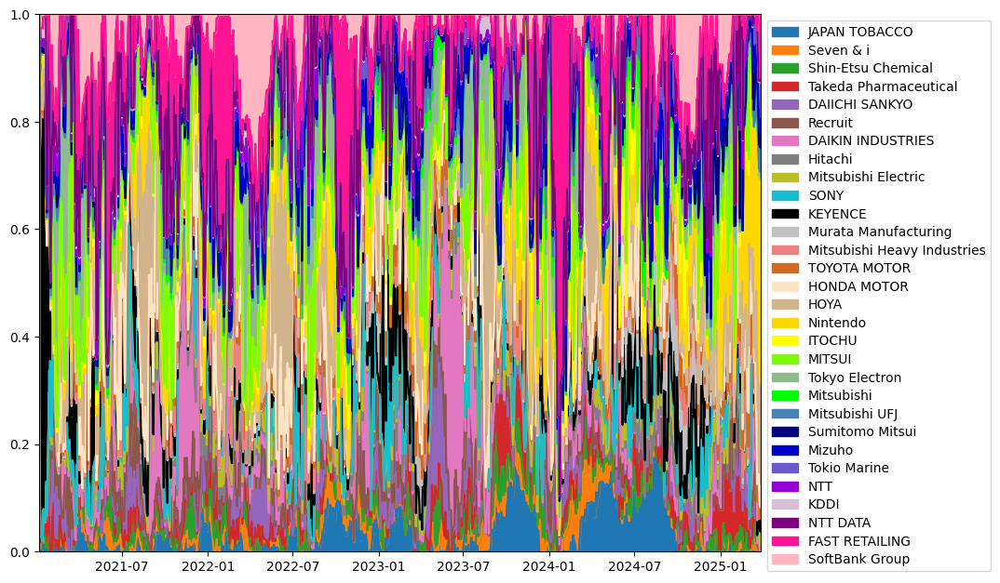

In [38]:
plot_portfolio_weights(market='JP', model='TD3', dates=trade_dates['JP'], weights=model_mem['TD3']['portfolio_weights']['JP'], tics=tickers['JP'], com_names=company_names['JP'])

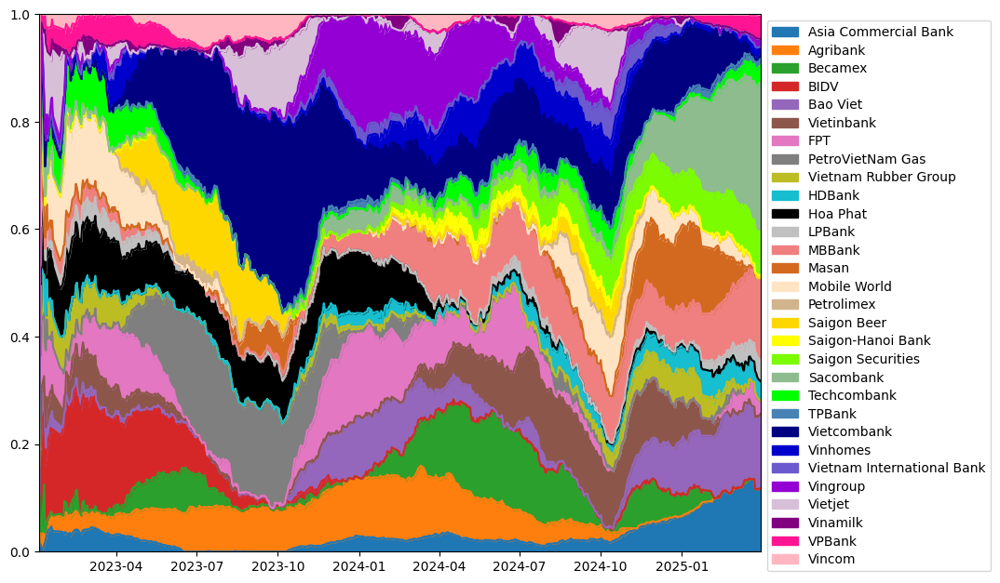

In [39]:
plot_portfolio_weights(market='VN', model='A2C', dates=trade_dates['VN'], weights=model_mem['A2C']['portfolio_weights']['VN'], tics=tickers['VN'], com_names=company_names['VN'])

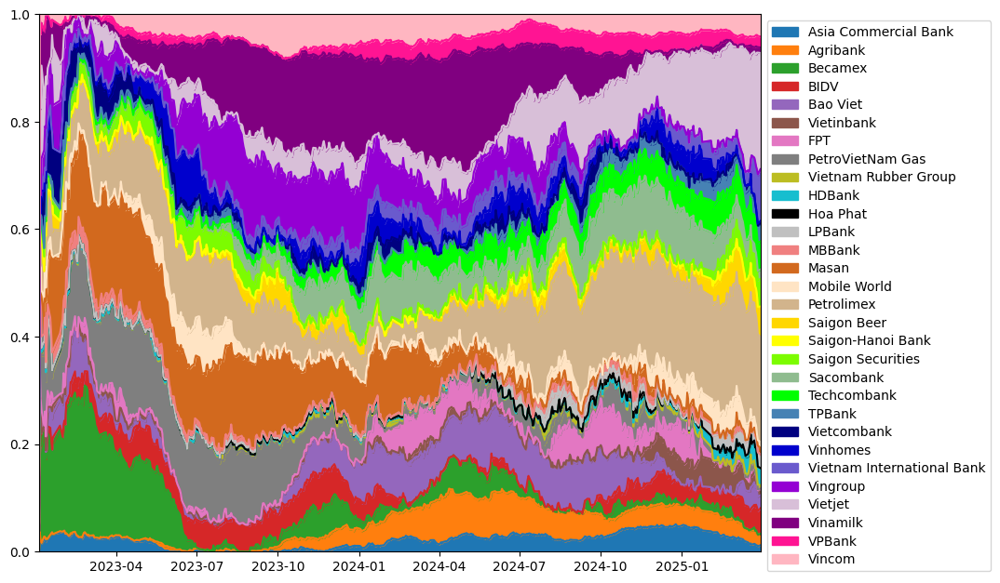

In [40]:
plot_portfolio_weights(market='VN', model='PPO', dates=trade_dates['VN'], weights=model_mem['PPO']['portfolio_weights']['VN'], tics=tickers['VN'], com_names=company_names['VN'])

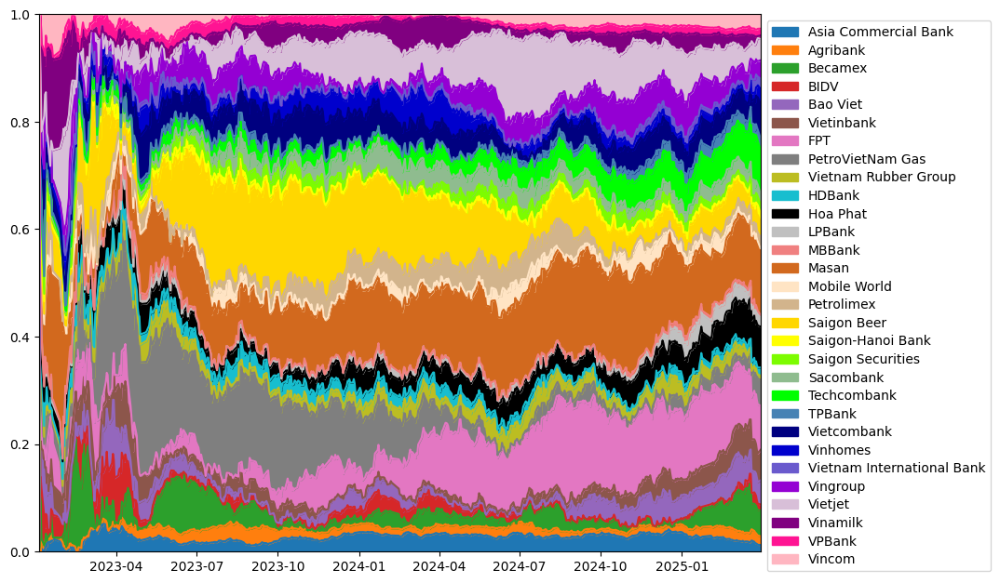

In [41]:
plot_portfolio_weights(market='VN', model='DDPG', dates=trade_dates['VN'], weights=model_mem['DDPG']['portfolio_weights']['VN'], tics=tickers['VN'], com_names=company_names['VN'])

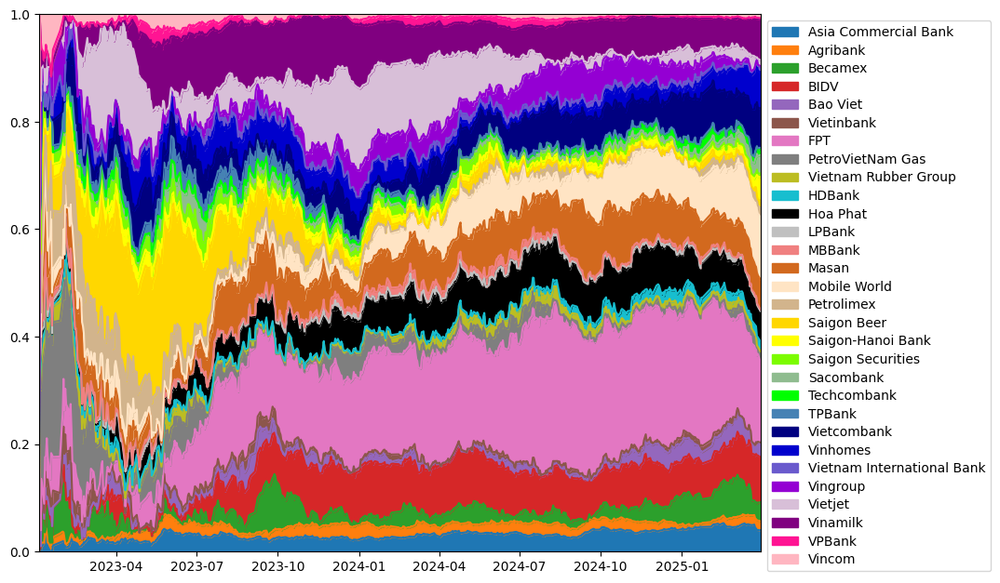

In [42]:
plot_portfolio_weights(market='VN', model='TD3', dates=trade_dates['VN'], weights=model_mem['TD3']['portfolio_weights']['VN'], tics=tickers['VN'], com_names=company_names['VN'])

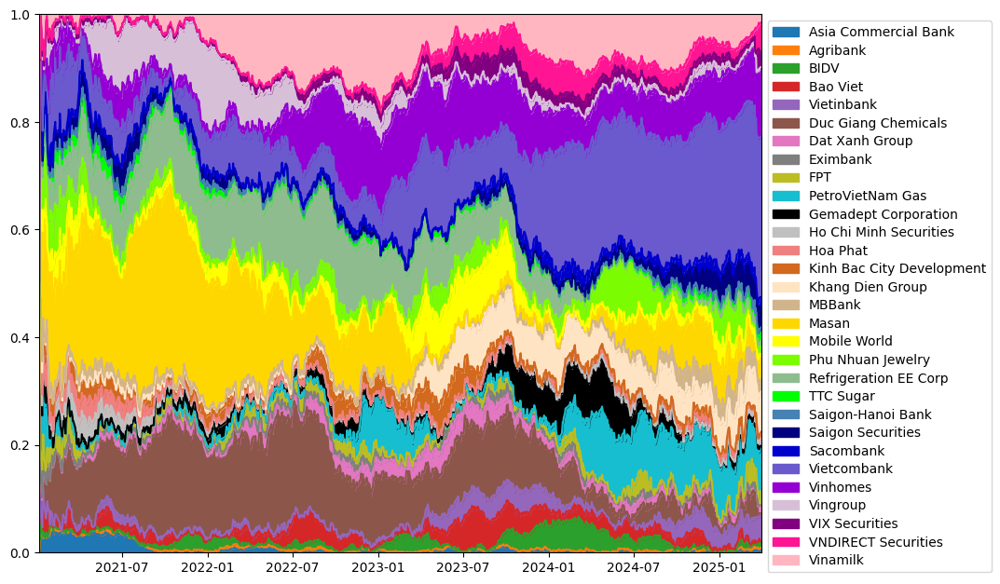

In [43]:
plot_portfolio_weights(market='VNn', model='A2C', dates=trade_dates['VNn'], weights=model_mem['A2C']['portfolio_weights']['VNn'], tics=tickers['VNn'], com_names=company_names['VNn'])

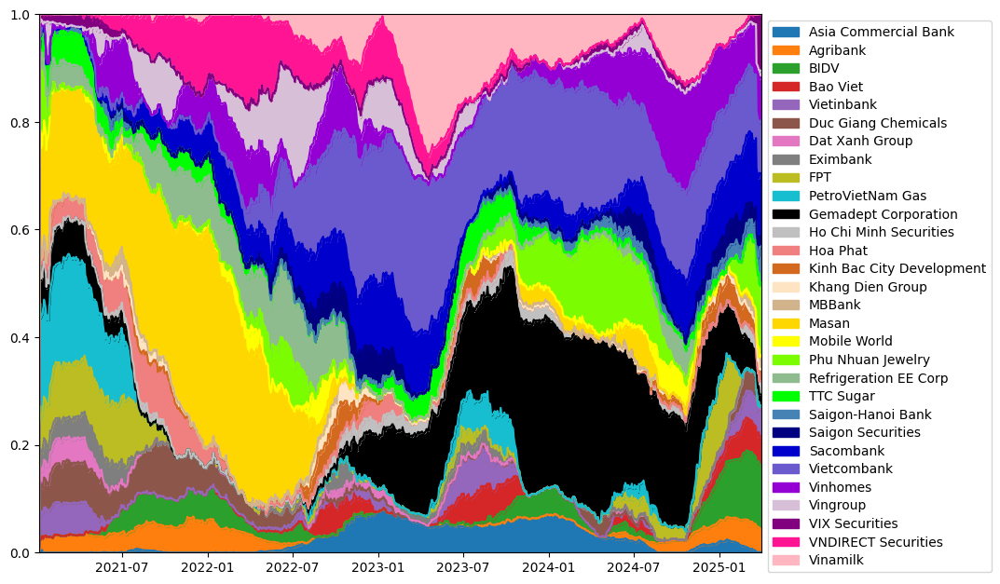

In [44]:
plot_portfolio_weights(market='VNn', model='PPO', dates=trade_dates['VNn'], weights=model_mem['PPO']['portfolio_weights']['VNn'], tics=tickers['VNn'], com_names=company_names['VNn'])

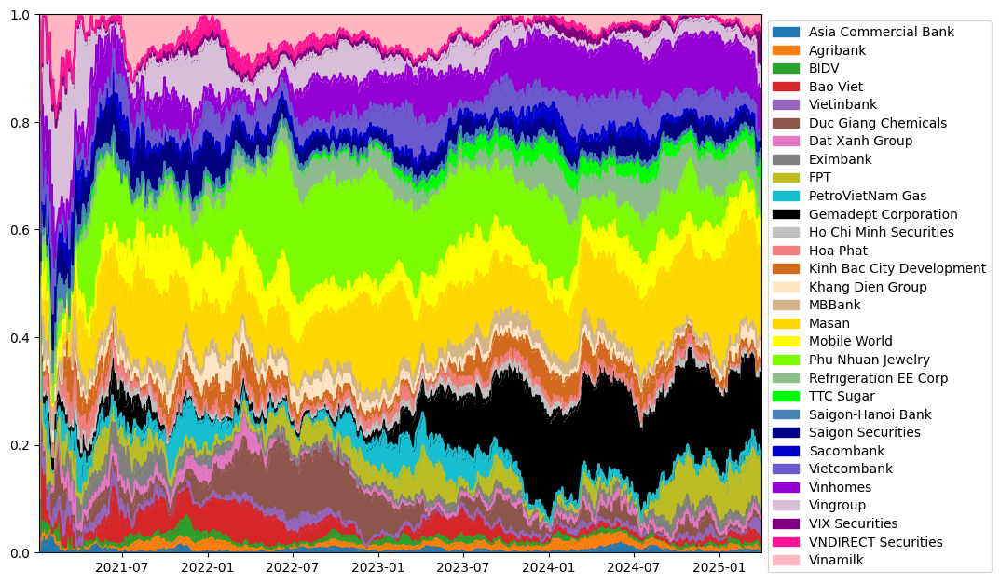

In [45]:
plot_portfolio_weights(market='VNn', model='DDPG', dates=trade_dates['VNn'], weights=model_mem['DDPG']['portfolio_weights']['VNn'], tics=tickers['VNn'], com_names=company_names['VNn'])

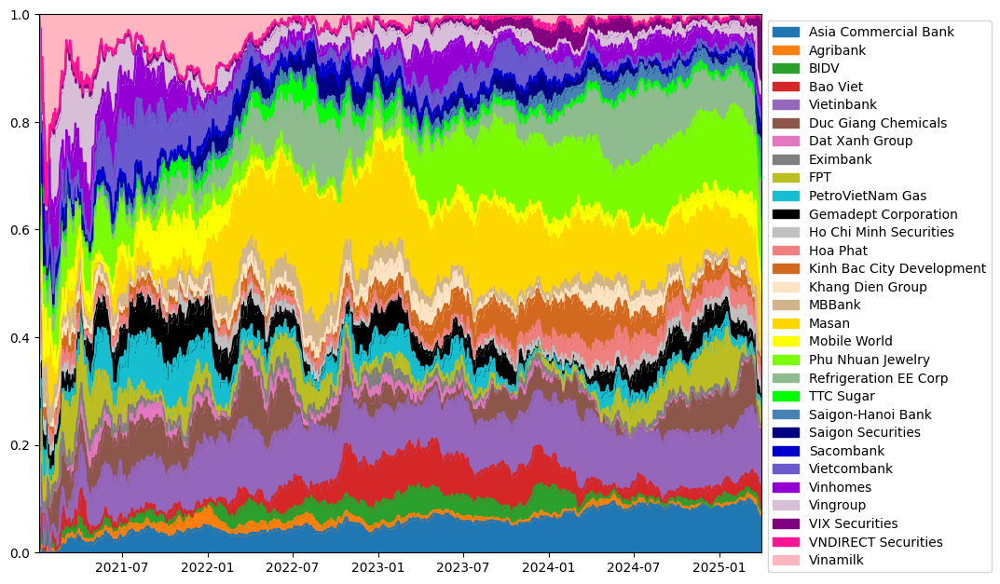

In [46]:
plot_portfolio_weights(market='VNn', model='TD3', dates=trade_dates['VNn'], weights=model_mem['TD3']['portfolio_weights']['VNn'], tics=tickers['VNn'], com_names=company_names['VNn'])

## 6. Rolling Volatility

In [ ]:
# plot_rolling_volatility(market='US', dates=trade_dates['US'], model_mem=model_mem, rolling_days=63)

## 7. Rolling Sharpe

In [ ]:
# plot_rolling_sharpe(market='US', dates=trade_dates['US'], model_mem=model_mem, rolling_days=63)

## 8. Series + Action at each step + Number of shares over time

In [ ]:
# actions_tickers = {'US': {}, 'JP': {}, 'VN': {}}
# n_shares_tickers = {'US': {}, 'JP': {}, 'VN': {}}

# for mk in markets:
#     action_matrix = list_to_matrix(model_mem[MODEL]['action_mem'][mk])
#     n_shares_matrix = list_to_matrix(model_mem[MODEL]['action_mem'][mk])

#     for i, tic in enumerate(tickers[mk]):
#         actions_tickers[mk][tic] = action_matrix[:, i]
#         n_shares_tickers[mk][tic] = n_shares_matrix[:, i]

In [ ]:
# plot_series_actions_shares(market='US', ticker='AAPL', model=MODEL, dates=trade_dates['US'], Y=Y_trade['US']['AAPL'], actions=actions_tickers['US']['AAPL'], n_shares_ticker=n_shares_tickers['US']['AAPL'])